In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/creat-a-thon

/content/drive/My Drive/creat-a-thon


In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import numpy as np
from PIL import Image
import io
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
# Load HAAR face classifier
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [ ]:
# Load functions
def face_extractor(img):
    # Function detects faces and returns the cropped face
    # If no face detected, it returns the input image
    
    #gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #faces = face_classifier.detectMultiScale(gray, 1.1, 4)
    faces = face_classifier.detectMultiScale(img, 1.1, 4)
    
    if faces is ():
        return None
    
    # Crop all faces found
    for (x,y,w,h) in faces:
        x=x-60
        y=y-70
        cropped_face = img[y:y+h+100, x:x+w+100]

    return cropped_face

In [ ]:
def byte2image(byte):
  jpeg = b64decode(byte.split(',')[1])
  im = Image.open(io.BytesIO(jpeg))
  return np.array(im)

def image2byte(image):
  image = Image.fromarray(image)
  buffer = io.BytesIO()
  image.save(buffer, 'jpeg')
  buffer.seek(0)
  x = b64encode(buffer.read()).decode('utf-8')
  return x

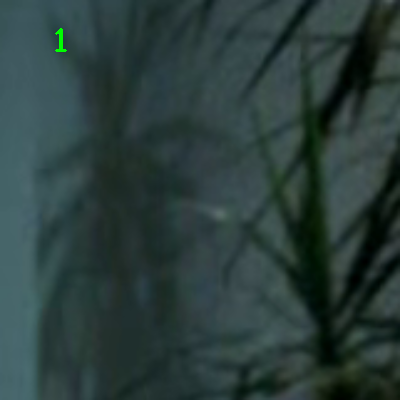

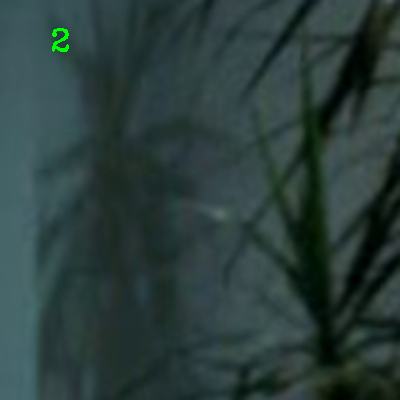

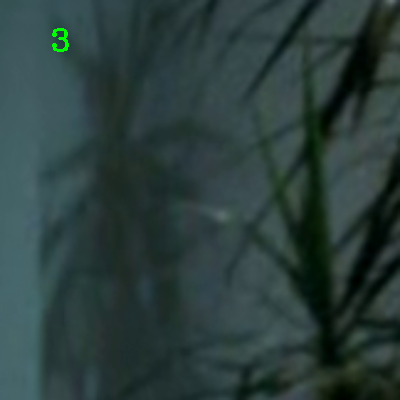

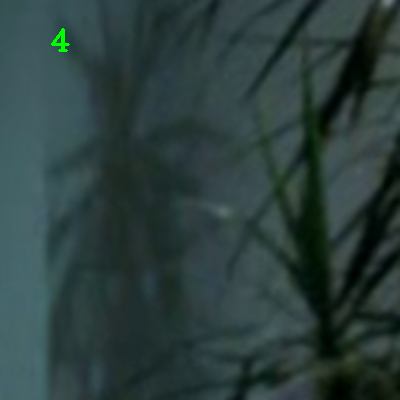

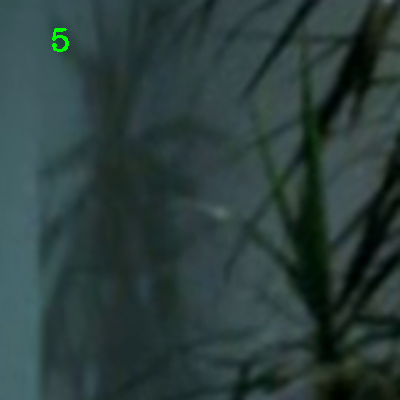

...

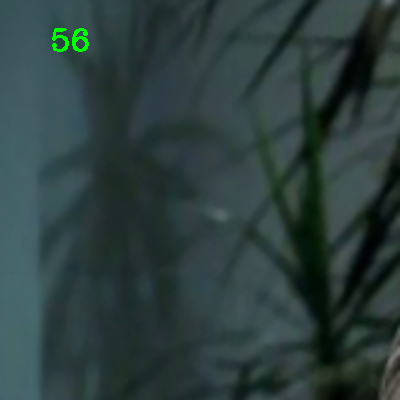

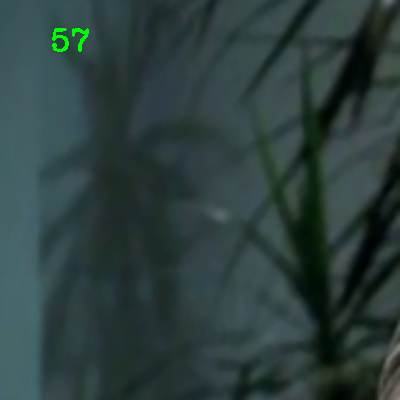

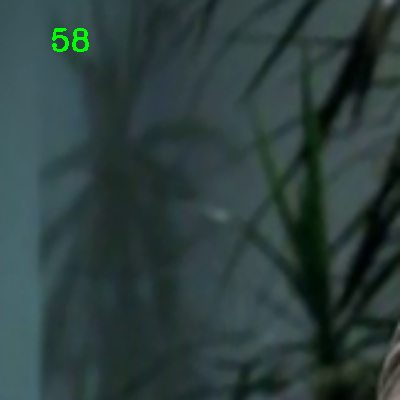

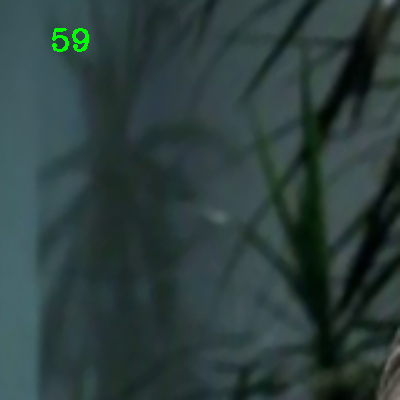

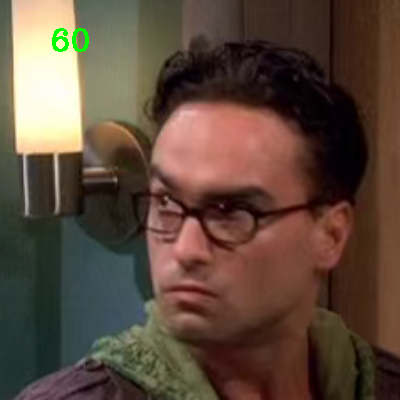

Face not found
Face not found
Face not found


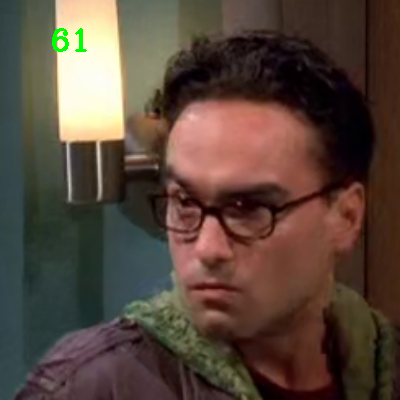

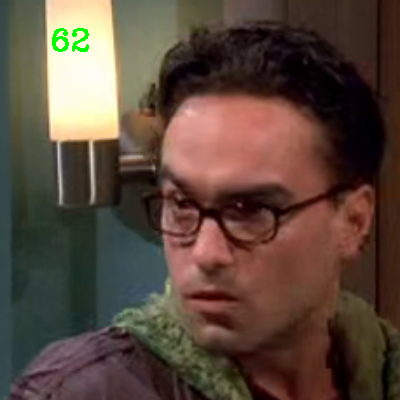

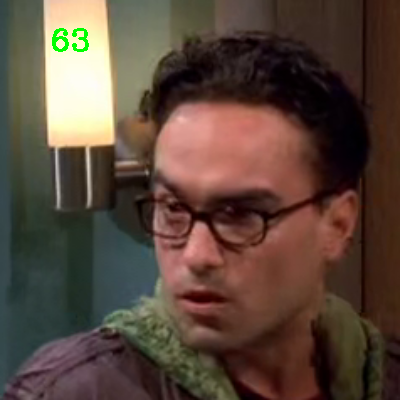

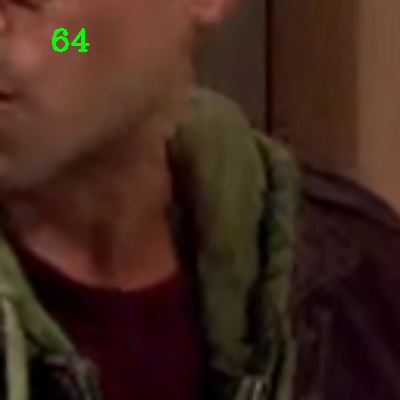

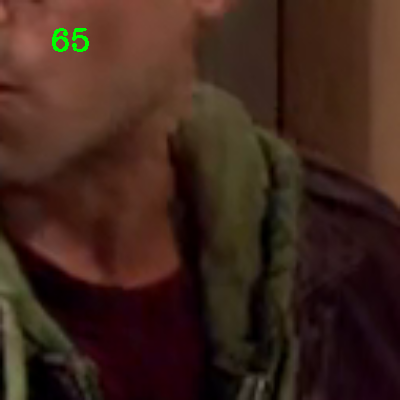

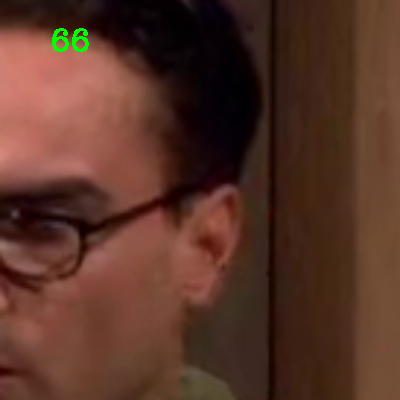

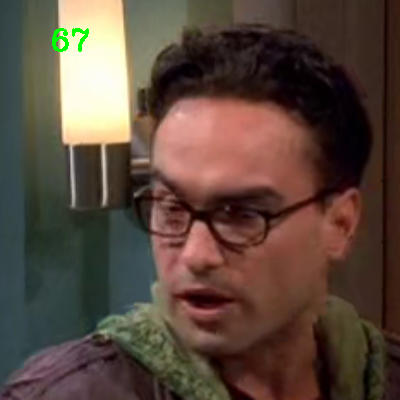

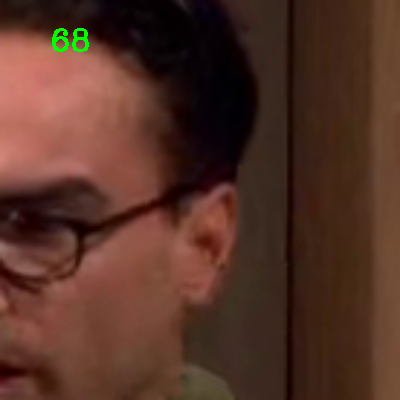

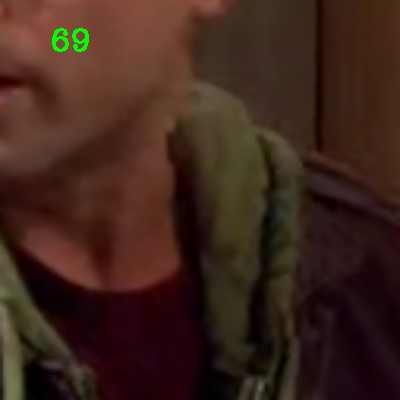

Face not found
Face not found


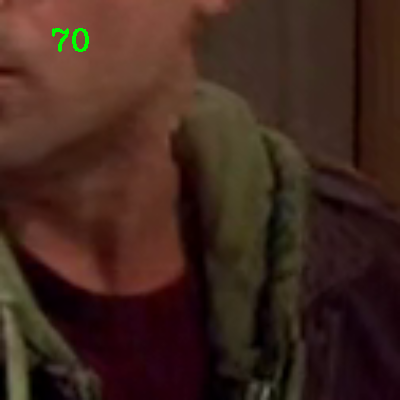

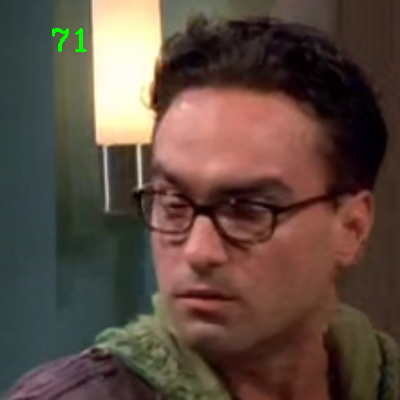

Face not found
Face not found
Face not found
Face not found
Face not found
Face not found


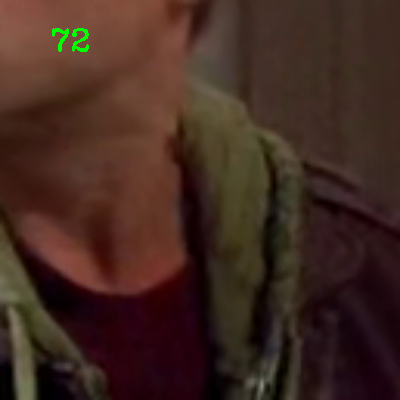

Face not found
Face not found
Face not found
Face not found
Face not found
Face not found
Face not found
Face not found
Face not found
Face not found
Face not found
Face not found


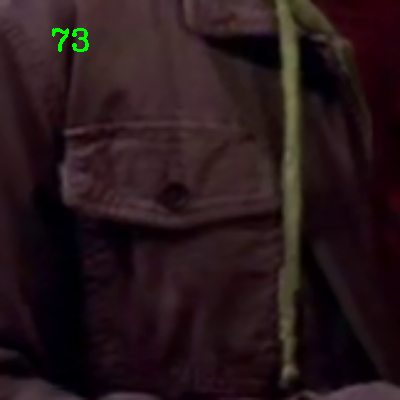

Face not found


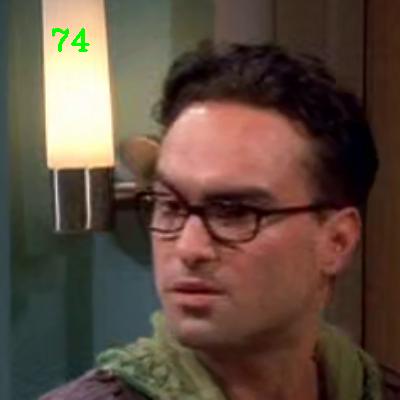

Face not found


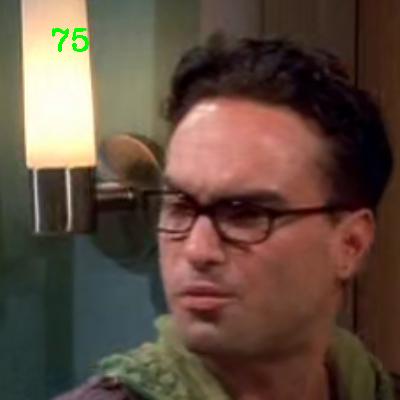

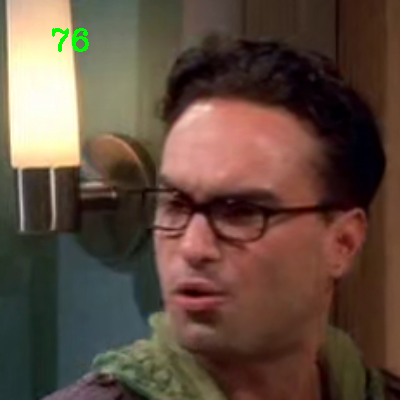

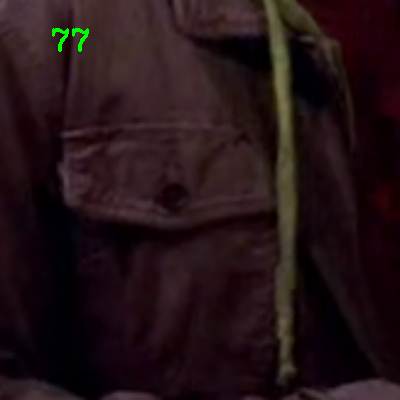

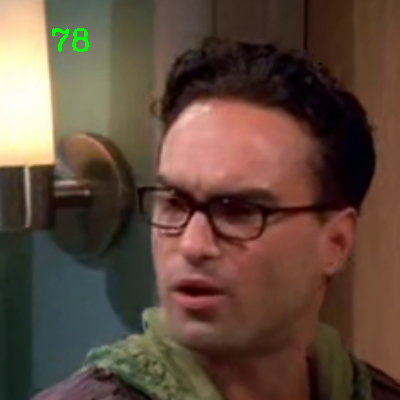

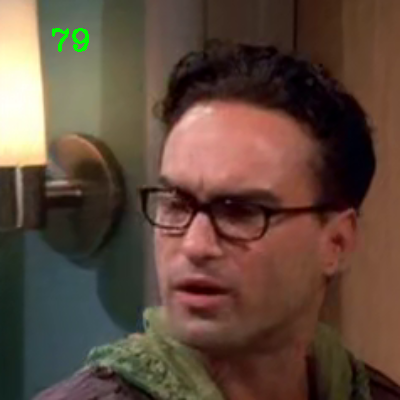

...

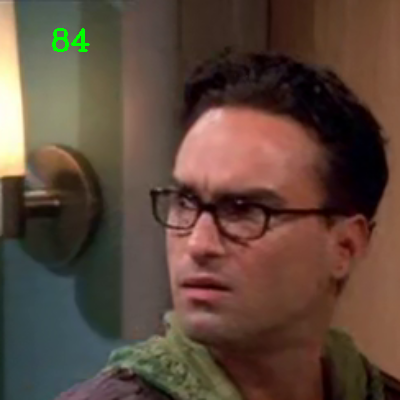

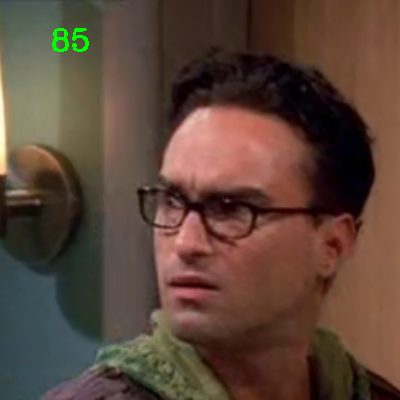

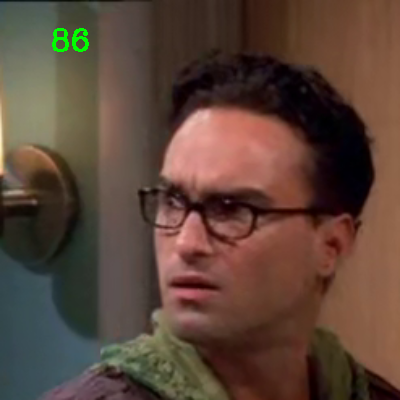

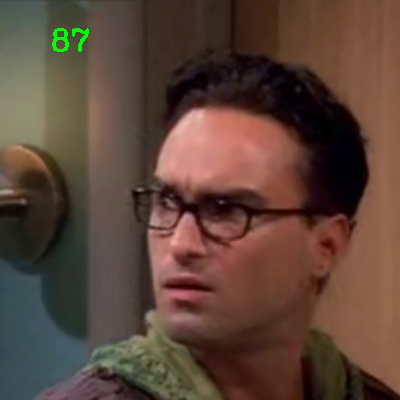

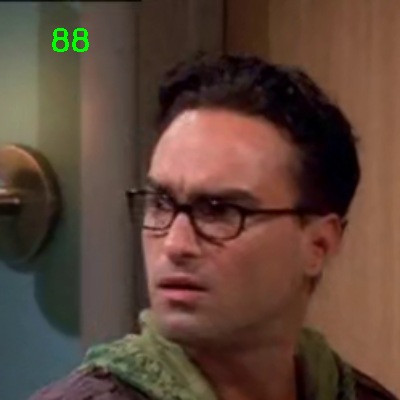

error: ignored

In [ ]:
#eval_js() ##
# To capture video from webcam. 
#cap = cv2.VideoCapture(0)
# To use a video file as input 
cap = cv2.VideoCapture('tbbt.mp4')

'''while True:
    # Read the frame
    _, img = cap.read()
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect the faces
    faces = face_cascade.detectMultiScale(gray, 1.1, 4)
    # Draw the rectangle around each face
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
    # Display
    #cv2.imshow('img', img)
    #eval_js('showimg("{}")'.format(image2byte(img)))##
    cv2_imshow('img', img)
    # Stop if escape key is pressed
    k = cv2.waitKey(30) & 0xff
    if k==27:
        break
# Release the VideoCapture object
cap.release()'''
count=0
while True:

    #ret, frame = cap.read()
    _, frame = cap.read()
    if face_extractor(frame) is not None:  
        count += 1
        face = cv2.resize(face_extractor(frame), (400, 400))
        #face = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Save file in specified directory with unique name
        file_name_path = './Images/' + str(count) + '.jpg'
        cv2.imwrite(file_name_path, cv2.cvtColor(face, cv2.COLOR_RGB2BGR))

        # Put count on images and display live count
        cv2.putText(face, str(count), (50, 50), cv2.FONT_HERSHEY_COMPLEX, 1, (0,255,0), 2)
        #eval_js('showimg("{}")'.format(image2byte(face)))
        cv2_imshow( face)
        
    else:
        print("Face not found")
        pass

    '''if cv2.waitKey(1) == 13 or count == 1: #13 is the Enter Key
        break'''
        
#cap.release()
cv2.destroyAllWindows()      
print("Collecting Samples Complete")